# **Preliminary Project Statement:** 
For a given heart disease dataset, we want to predict the presence of the heart disease based on the patient attributes using classification.


**Well defined Question:**

How accurately can we predict the presence of heart disease using classification?


---
[Heart Disease Dataset](https://archive.ics.uci.edu/ml/datasets/Heart+Disease?spm=5176.100239.blogcont54260.8.TRNGoO)

**Data Set Information:**

This database contains 76 attributes, but all published experiments refer to using a subset of 14 of them. In particular, the Cleveland database is the only one that has been used by ML researchers to
this date. The "goal" field refers to the presence of heart disease in the patient. It is integer valued from 0 (no presence) to 4. Experiments with the Cleveland database have concentrated on simply attempting to distinguish presence (values 1,2,3,4) from absence (value 0).

The names and social security numbers of the patients were recently removed from the database, replaced with dummy values.

One file has been "processed", that one containing the Cleveland database. All four unprocessed files also exist in this directory.

To see Test Costs (donated by Peter Turney), please see the folder "Costs" 


---
**14 Attributes used:**

age, sex, cp, trestbps,chol, fbs, restecg,thalach, exang, oldpeak, slope, ca, thal,num

**Description of 13 Input variables**

**Age:** age of the patient

**Sex:**

0: Female

1: Male

**Chest Pain Type (cp):**

0: Typical Angina

1: Atypical Angina

2: Non-Anginal Pain

3: Asymptomatic

**Resting Blood Pressure:** Person's resting blood pressure(trestbps).

**Cholesterol (chol):** Serum Cholesterol in mg/dl

**Fasting Blood Sugar (fbs):**

0:Less Than 120mg/ml

1: Greater Than 120mg/ml

**Resting Electrocardiographic Measurement(restecg):**

0: Normal

1: ST-T Wave Abnormality

2: Left Ventricular Hypertrophy

**Max Heart Rate Achieved (thalch):** Maximum Heart Rate Achieved 

**Exercise Induced Angina (exang):**

1: Yes

0: No

**ST Depression (oldpeak):** ST depression induced by exercise relative to rest.
**Slope:** Slope of the peak exercise ST segment (slope):

0: Upsloping

1: Flat

2: Downsloping

**Thalassemia (thal):** A blood disorder called 'Thalassemia' :

0: Normal

1: Fixed Defect

2: Reversible Defect

**Number of Major Vessels (ca):** Number of major vessels colored by fluoroscopy.

** 1 Output variables:** 
**num:** diagnosis of heart disease (angiographic disease status): 
    
 0-  < 50% diameter narrowing 
 
 1- > 50% diameter narrowing

---


<a id='import_library'></a>
<h2><b><u>Import  Libraries</u></b></h2>

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# compare knn imputation strategies for the horse colic dataset
from numpy import mean
from numpy import std
from pandas import read_csv
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import KNNImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from matplotlib import pyplot
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

#Missing Value conda install -c conda-forge/label/gcc7 missingno
import missingno as msno


from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


import os
import warnings

warnings.filterwarnings('ignore')

from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import metrics
from tabulate import tabulate

from xgboost import XGBClassifier

<a id='Data_load'></a>
<h2><b><u> A. Loading ALL Dataset </u></b></h2>

<a id='L_a1'></a>
#### A.1 ) Upload the Cleveland Data

In [ ]:
#upload the file in the lab
##from google.colab import files
##uploaded = files.upload()
#read the datafile using pandas read_csv


Saving processed.cleveland.data to processed.cleveland (1).data


In [ ]:
##import io
##cleveland_df= pd.read_csv(io.BytesIO(uploaded['processed.cleveland.data']), header=None)
##cleveland_df.columns = ["age", "sex", "cp", "trestbps","chol", "fbs", "restecg","thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]
##cleveland_df

cleveland_file = "./processed.cleveland.data"
cleveland_df = pd.read_csv(cleveland_file, header=None)
cleveland_df.columns = ["age", "sex", "cp", "trestbps","chol", "fbs", "restecg","thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]
#cleveland_df = cleveland_df.replace('?', np.nan)
cleveland_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,1
299,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,2
300,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,3
301,57.0,0.0,2.0,130.0,236.0,0.0,2.0,174.0,0.0,0.0,2.0,1.0,3.0,1


* Upload Switzerland data

In [ ]:
#upload the file in the lab
##from google.colab import files
##uploaded = files.upload()
#read the datafile using pandas read_csv
##import io
##switzerland_df= pd.read_csv(io.BytesIO(uploaded['processed.switzerland.data']), header=None)
##switzerland_df.columns = ["age", "sex", "cp", "trestbps","chol", "fbs", "restecg","thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]
##switzerland_df 

switzerland_file = "./processed.switzerland.data"
switzerland_df = pd.read_csv(switzerland_file, header=None)
switzerland_df.columns = ["age", "sex", "cp", "trestbps","chol", "fbs", "restecg","thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]
#switzerland_df = switzerland_df.replace('?', np.nan)
switzerland_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,32,1,1,95,0,?,0,127,0,.7,1,?,?,1
1,34,1,4,115,0,?,?,154,0,.2,1,?,?,1
2,35,1,4,?,0,?,0,130,1,?,?,?,7,3
3,36,1,4,110,0,?,0,125,1,1,2,?,6,1
4,38,0,4,105,0,?,0,166,0,2.8,1,?,?,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,70,1,4,115,0,0,1,92,1,0,2,?,7,1
119,70,1,4,140,0,1,0,157,1,2,2,?,7,3
120,72,1,3,160,0,?,2,114,0,1.6,2,2,?,0
121,73,0,3,160,0,0,1,121,0,0,1,?,3,1


* Upload the Hungarian dataset

In [ ]:
#upload the file in the lab
##from google.colab import files
##uploaded = files.upload()
#read the datafile using pandas read_csv
##import io
##hungarian_df= pd.read_csv(io.BytesIO(uploaded['processed.hungarian.data']), header=None)
##hungarian_df.columns = ["age", "sex", "cp", "trestbps","chol", "fbs", "restecg","thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]
##hungarian_df

hungarian_file = "./processed.hungarian.data"
hungarian_df = pd.read_csv(hungarian_file, header=None)
hungarian_df.columns = ["age", "sex", "cp", "trestbps","chol", "fbs", "restecg","thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]
hungarian_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,28,1,2,130,132,0,2,185,0,0.0,?,?,?,0
1,29,1,2,120,243,0,0,160,0,0.0,?,?,?,0
2,29,1,2,140,?,0,0,170,0,0.0,?,?,?,0
3,30,0,1,170,237,0,1,170,0,0.0,?,?,6,0
4,31,0,2,100,219,0,1,150,0,0.0,?,?,?,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,52,1,4,160,331,0,0,94,1,2.5,?,?,?,1
290,54,0,3,130,294,0,1,100,1,0.0,2,?,?,1
291,56,1,4,155,342,1,0,150,1,3.0,2,?,?,1
292,58,0,2,180,393,0,0,110,1,1.0,2,?,7,1


* Upload the VA dataset

In [ ]:
#upload the file in the lab
##from google.colab import files
##uploaded = files.upload()
#read the datafile using pandas read_csv
##import io
##va_df= pd.read_csv(io.BytesIO(uploaded['processed.va.data']), header=None)
##va_df.columns = ["age", "sex", "cp", "trestbps","chol", "fbs", "restecg","thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]
##va_df

va_file = "./processed.va.data"
va_df = pd.read_csv(va_file, header=None)
va_df.columns = ["age", "sex", "cp", "trestbps","chol", "fbs", "restecg","thalach", "exang", "oldpeak", "slope", "ca", "thal", "num"]
va_df


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63,1,4,140,260,0,1,112,1,3,2,?,?,2
1,44,1,4,130,209,0,1,127,0,0,?,?,?,0
2,60,1,4,132,218,0,1,140,1,1.5,3,?,?,2
3,55,1,4,142,228,0,1,149,1,2.5,1,?,?,1
4,66,1,3,110,213,1,2,99,1,1.3,2,?,?,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,54,0,4,127,333,1,1,154,0,0,?,?,?,1
196,62,1,1,?,139,0,1,?,?,?,?,?,?,0
197,55,1,4,122,223,1,1,100,0,0,?,?,6,2
198,58,1,4,?,385,1,2,?,?,?,?,?,?,0


<a id='P_EDA'></a>
<h2><b><u> B. Preliminary EDA </u></b></h2>

* Shape of the datasets

In [ ]:
print(" Cleveland dataset: ( rows, columns) = ",cleveland_df.shape)
print(" Switzerland dataset: ( rows, columns) = ",switzerland_df.shape)
print(" Hungarian dataset: ( rows, columns) = ",hungarian_df.shape)
print(" VA dataset: ( rows, columns) = ",va_df.shape)

 Cleveland dataset: ( rows, columns) =  (303, 14)
 Switzerland dataset: ( rows, columns) =  (123, 14)
 Hungarian dataset: ( rows, columns) =  (294, 14)
 VA dataset: ( rows, columns) =  (200, 14)


**Check the missing values in each columns**

In [ ]:
# Missing data in Cleveland dataset marking as Nan and finding its frequency in each column
cleveland_df = cleveland_df.replace('?', np.nan)
cleveland_nan = pd.DataFrame(cleveland_df.isnull().sum())
cleveland_nan

#missingValueColumns = cleveland_df[cleveland_df.isnull().any()].tolist()
#msno.bar(cleveland_df[missingValueColumns],\
#            figsize=(20,8),color="#34495e",fontsize=12,labels=True,)

,0
age,0
sex,0
cp,0
trestbps,0
chol,0
fbs,0
restecg,0
thalach,0
exang,0
oldpeak,0


In [ ]:
# Missing data in Switzerland dataset marking as Nan and finding its frequency in each column
switzerland_df = switzerland_df.replace('?', np.nan)
switzerland_nan = pd.DataFrame(switzerland_df.isnull().sum())
switzerland_nan

,0
age,0
sex,0
cp,0
trestbps,2
chol,0
fbs,75
restecg,1
thalach,1
exang,1
oldpeak,6


In [ ]:
# Missing data in Hungarian dataset marking as Nan and finding its frequency in each column
hungarian_df = hungarian_df.replace('?', np.nan)
hungarian_nan = pd.DataFrame(hungarian_df.isnull().sum())
hungarian_nan

,0
age,0
sex,0
cp,0
trestbps,1
chol,23
fbs,8
restecg,1
thalach,1
exang,1
oldpeak,0


In [ ]:
# Missing data in VA dataset marking as Nan and finding its frequency in each column
va_df = va_df.replace('?', np.nan)
va_nan = pd.DataFrame(va_df.isnull().sum())
va_nan

,0
age,0
sex,0
cp,0
trestbps,56
chol,7
fbs,7
restecg,0
thalach,53
exang,53
oldpeak,56


**Descriptive statistics of the each features( this will help use to identify some type errors or sometimes zero rows**

In [ ]:
cleveland_df.describe(include='all')

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,299,301,303.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,3,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,3.0,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,176,166,NaN
mean,54.438944,0.679868,3.158416,131.689769,246.693069,0.148515,0.990099,149.607261,0.326733,1.039604,1.600660,NaN,NaN,0.937294
std,9.038662,0.467299,0.960126,17.599748,51.776918,0.356198,0.994971,22.875003,0.469794,1.161075,0.616226,NaN,NaN,1.228536
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,NaN,NaN,0.000000
25%,48.000000,0.000000,3.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,NaN,NaN,0.000000
50%,56.000000,1.000000,3.000000,130.000000,241.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,NaN,NaN,0.000000
75%,61.000000,1.000000,4.000000,140.000000,275.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,NaN,NaN,2.000000


In [ ]:
switzerland_df.describe(include='all')

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
count,123.000000,123.000000,123.000000,121,123.0,48,122,122,122,117,106,5,71,123.000000
unique,NaN,NaN,NaN,20,NaN,2,3,67,2,35,3,2,3,NaN
top,NaN,NaN,NaN,115,NaN,0,0,120,0,0,2,2,7,NaN
freq,NaN,NaN,NaN,14,NaN,43,85,9,68,42,61,3,42,NaN
mean,55.317073,0.918699,3.699187,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.804878
std,9.032108,0.274414,0.688726,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.013503
min,32.000000,0.000000,1.000000,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,51.000000,1.000000,4.000000,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000
50%,56.000000,1.000000,4.000000,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000
75%,61.500000,1.000000,4.000000,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000


In [ ]:
hungarian_df.describe(include="all")

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
count,294.000000,294.000000,294.000000,293,271,286,293,293,293,294.000000,104,3,28,294.000000
unique,NaN,NaN,NaN,31,153,2,3,71,2,NaN,3,1,3,NaN
top,NaN,NaN,NaN,120,275,0,0,150,0,NaN,2,0,7,NaN
freq,NaN,NaN,NaN,65,5,266,235,29,204,NaN,91,3,11,NaN
mean,47.826531,0.724490,2.982993,NaN,NaN,NaN,NaN,NaN,NaN,0.586054,NaN,NaN,NaN,0.360544
std,7.811812,0.447533,0.965117,NaN,NaN,NaN,NaN,NaN,NaN,0.908648,NaN,NaN,NaN,0.480977
min,28.000000,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000
25%,42.000000,0.000000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000
50%,49.000000,1.000000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000
75%,54.000000,1.000000,4.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,1.000000


In [ ]:
va_df.describe(include='all')

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
count,200.000000,200.000000,200.000000,144,193,193,200.000000,147,147,144,98,2,34,200.000000
unique,NaN,NaN,NaN,40,99,2,NaN,59,2,14,3,1,3,NaN
top,NaN,NaN,NaN,120,0,0,NaN,140,1,0,2,0,7,NaN
freq,NaN,NaN,NaN,16,49,125,NaN,12,95,40,53,2,22,NaN
mean,59.350000,0.970000,3.505000,NaN,NaN,NaN,0.735000,NaN,NaN,NaN,NaN,NaN,NaN,1.520000
std,7.811697,0.171015,0.795701,NaN,NaN,NaN,0.683455,NaN,NaN,NaN,NaN,NaN,NaN,1.219441
min,35.000000,0.000000,1.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,55.000000,1.000000,3.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
50%,60.000000,1.000000,4.000000,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000
75%,64.000000,1.000000,4.000000,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,3.000000


#**Data Cleaning**

 ## Basic Data cleaning


Redantant columns : 

**Identifying the columns with single values:**  Delete them

**Identifying  the columns with very few values but more than one:**

Be careful before deleting as it might be representing the categorical dataset. 



  

In [ ]:
# Checking for Redundant columns
print("\n\nUnique column values in Cleveland dataset\n", cleveland_df.nunique())



Unique column values in Cleveland dataset
 age          41
sex           2
cp            4
trestbps     50
chol        152
fbs           2
restecg       3
thalach      91
exang         2
oldpeak      40
slope         3
ca            4
thal          3
num           5
dtype: int64


In [ ]:
# Checking for Redundant columns
print("\n\nUnique column values in Switzerland dataset\n", switzerland_df.nunique())



Unique column values in Switzerland dataset
 age         37
sex          2
cp           4
trestbps    20
chol         1
fbs          2
restecg      3
thalach     67
exang        2
oldpeak     35
slope        3
ca           2
thal         3
num          5
dtype: int64


In [ ]:
# Checking for Redundant columns
print("\n\nUnique column values in Hungarian dataset\n", hungarian_df.nunique())



Unique column values in Hungarian dataset
 age          38
sex           2
cp            4
trestbps     31
chol        153
fbs           2
restecg       3
thalach      71
exang         2
oldpeak      10
slope         3
ca            1
thal          3
num           2
dtype: int64


In [ ]:
# Checking for Redundant columns
print("\n\nUnique column values in VA dataset\n", va_df.nunique())



Unique column values in VA dataset
 age         39
sex          2
cp           4
trestbps    40
chol        99
fbs          2
restecg      3
thalach     59
exang        2
oldpeak     14
slope        3
ca           1
thal         3
num          5
dtype: int64


**Decision:** No column has only one value and the columns with very few values(more than one) are categorical columns.. not deleting any  

*Basic data cleaning*

Duplicate Rows

In [ ]:
dups_cleveland=cleveland_df.duplicated()
print(dups_cleveland.any())
print(cleveland_df[dups_cleveland])

False
Empty DataFrame
Columns: [age, sex, cp, trestbps, chol, fbs, restecg, thalach, exang, oldpeak, slope, ca, thal, num]
Index: []


In [ ]:
dups_switzerland=switzerland_df.duplicated()
print(dups_switzerland.any())
print(switzerland_df[dups_switzerland])

False
Empty DataFrame
Columns: [age, sex, cp, trestbps, chol, fbs, restecg, thalach, exang, oldpeak, slope, ca, thal, num]
Index: []


In [ ]:
dups_hungarian= hungarian_df.duplicated()
print(dups_hungarian.any())
print(hungarian_df[dups_hungarian])

True
     age  sex  cp trestbps chol fbs restecg thalach exang  oldpeak slope   ca  \
102   49    0   2      110  NaN   0       0     160     0      0.0   NaN  NaN   

    thal  num  
102  NaN    0  


In [ ]:
dups_va= va_df.duplicated()
print(dups_va.any())
print(va_df[dups_va])

True
     age  sex  cp trestbps chol fbs  restecg thalach exang oldpeak slope   ca  \
187   58    1   3      150  219   0        1     118     1       0   NaN  NaN   

    thal  num  
187  NaN    2  


#**Imuputation**
We will run *KNN imputer* and *Iterative imputer* on 5 different combination of dataframes as follows:


##**Creating different Dataframes**

Below are the combination of different dataset 
1. Cleveland , hungarian , switzerland , Va
2. Cleveland , hungarian  
3. Cleveland , switzerland
4. Cleveland , hungarian , switzerland
5. Cleveland


We are trying to find best K value for KNN_Imputer by applying RandomforestClassifier to find bext accuracy

###**1. Cleveland + hungarian + switzerland + Va**

In [ ]:
#Complete dataset
Heart_Disease_DF = pd.concat([cleveland_df,hungarian_df,switzerland_df,va_df])
Heart_Disease_DF.shape

(920, 14)

###**2. Cleveland + hungarian**

In [ ]:
Clev_hung_df = pd.concat([cleveland_df,hungarian_df])

###**3. Cleveland + switzerland**

In [ ]:
Clev_switz_df = pd.concat([cleveland_df,switzerland_df])

###**4. Cleveland + switzerland + hungarian**

In [ ]:
Clev_hung_switz_df = pd.concat([cleveland_df,hungarian_df,switzerland_df])

###**--------------------KNN imputation-------------------------**


###**KNN Imputer** 

* Use MinMaxScaler to scale X
* Converting target variables to binary


In [ ]:
#function to optimize the knn imputer
def optimize_knn_imputer(data, target,name):
    results = list()
    dict = {'Name':[],
        'K':[],
        'MeanAccuracy':[],
        'stdAccuracy':[]
       }
    df = pd.DataFrame(dict)
    for s in range(1, 50, 2):
        imputer = KNNImputer(n_neighbors=s, weights='distance', metric='nan_euclidean')
        array = data.values
        X = array [:,:-1]
        Y = data[target]
        
        #converting target variables to binary
        data['num'][data.num >0] = 1
        Y_temp = data['num']

    
        trans = MinMaxScaler()
        trans_X = trans.fit_transform(X)
        
        X_imputed = imputer.fit_transform(trans_X)
        X_imputed_df = pd.DataFrame(X_imputed, columns=data.drop(target, axis=1).columns)
        
        model = RandomForestClassifier()
        cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
        scores = cross_val_score(model, X_imputed, Y_temp, scoring='accuracy', cv=cv, n_jobs=-1)       
        results.append(scores)
        df.loc[len(df.index)] = [name, s, mean(scores), std(scores)] 
        #print('>K : %s --> Mean : %.3f --> Std : (%.3f)' % (s, mean(scores), std(scores)))   
    #max(results)
    display(df)
    pyplot.boxplot(results, labels=range(1, 50, 2), showmeans=True)
    pyplot.show()
    return df
    #df.loc[df['MeanAccuracy'] == df['MeanAccuracy'].max()] 

###**1. KNN imputation on Cleveland + hungarian + switzerland + Va**

,Name,K,MeanAccuracy,stdAccuracy
0,cleveland+hungarian+switzerland+va,1.0,0.822826,0.028365
1,cleveland+hungarian+switzerland+va,3.0,0.829710,0.026674
2,cleveland+hungarian+switzerland+va,5.0,0.826812,0.037855
3,cleveland+hungarian+switzerland+va,7.0,0.826449,0.032303
4,cleveland+hungarian+switzerland+va,9.0,0.830072,0.032667
5,cleveland+hungarian+switzerland+va,11.0,0.823551,0.030186
6,cleveland+hungarian+switzerland+va,13.0,0.825000,0.033952
7,cleveland+hungarian+switzerland+va,15.0,0.821739,0.034555
8,cleveland+hungarian+switzerland+va,17.0,0.825362,0.028474
9,cleveland+hungarian+switzerland+va,19.0,0.828261,0.029488


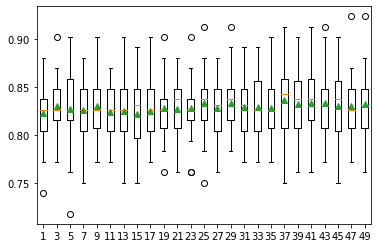

In [ ]:
df1 = optimize_knn_imputer(Heart_Disease_DF,'num','cleveland+hungarian+switzerland+va')

In [ ]:
df1.loc[df1['MeanAccuracy'] == df1['MeanAccuracy'].max()] 
# getting slightly different result than anwesh

,Name,K,MeanAccuracy,stdAccuracy
18,cleveland+hungarian+switzerland+va,37.0,0.836232,0.034933


###**2. KNN imputation on Cleveland + hungarian**

,Name,K,MeanAccuracy,stdAccuracy
0,cleveland+hungarian,1.0,0.817985,0.044266
1,cleveland+hungarian,3.0,0.842627,0.042169
2,cleveland+hungarian,5.0,0.839247,0.044188
3,cleveland+hungarian,7.0,0.834774,0.037428
4,cleveland+hungarian,9.0,0.830857,0.042731
5,cleveland+hungarian,11.0,0.830857,0.046619
6,cleveland+hungarian,13.0,0.835932,0.043827
7,cleveland+hungarian,15.0,0.835339,0.044196
8,cleveland+hungarian,17.0,0.831403,0.036219
9,cleveland+hungarian,19.0,0.836488,0.042552


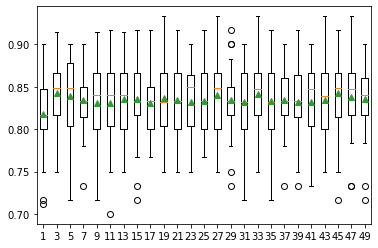

In [ ]:
df2 = optimize_knn_imputer(Clev_hung_df,'num','cleveland+hungarian')

In [ ]:
df2.loc[df2['MeanAccuracy'] == df2['MeanAccuracy'].max()] 

,Name,K,MeanAccuracy,stdAccuracy
22,cleveland+hungarian,45.0,0.843117,0.047486


###**3. KNN imputation on Cleveland + Switzerland**

,Name,K,MeanAccuracy,stdAccuracy
0,cleveland+switzerland,1.0,0.845847,0.058565
1,cleveland+switzerland,3.0,0.855980,0.060873
2,cleveland+switzerland,5.0,0.856035,0.058696
3,cleveland+switzerland,7.0,0.854448,0.056862
4,cleveland+switzerland,9.0,0.856737,0.052588
5,cleveland+switzerland,11.0,0.855297,0.056312
6,cleveland+switzerland,13.0,0.859911,0.059537
7,cleveland+switzerland,15.0,0.858306,0.060598
8,cleveland+switzerland,17.0,0.856700,0.059843
9,cleveland+switzerland,19.0,0.863012,0.052948


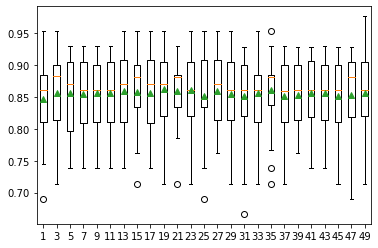

In [ ]:
df3 = optimize_knn_imputer(Clev_switz_df,'num','cleveland+switzerland')

In [ ]:
df3.loc[df3['MeanAccuracy'] == df3['MeanAccuracy'].max()] 

,Name,K,MeanAccuracy,stdAccuracy
9,cleveland+switzerland,19.0,0.863012,0.052948


###**4. KNN imputation on Cleveland + hungarian + switzerland**

,Name,K,MeanAccuracy,stdAccuracy
0,cleveland+hungarian+switzerland,1.0,0.847685,0.027424
1,cleveland+hungarian+switzerland,3.0,0.859722,0.028990
2,cleveland+hungarian+switzerland,5.0,0.849074,0.031001
3,cleveland+hungarian+switzerland,7.0,0.849074,0.028176
4,cleveland+hungarian+switzerland,9.0,0.846296,0.038779
5,cleveland+hungarian+switzerland,11.0,0.846759,0.033923
6,cleveland+hungarian+switzerland,13.0,0.851852,0.029644
7,cleveland+hungarian+switzerland,15.0,0.848148,0.032262
8,cleveland+hungarian+switzerland,17.0,0.850000,0.034657
9,cleveland+hungarian+switzerland,19.0,0.852778,0.034322


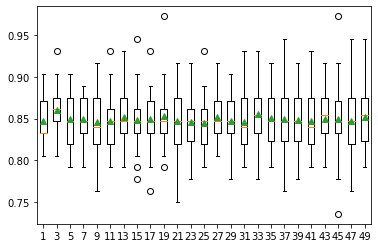

In [ ]:
df4 = optimize_knn_imputer(Clev_hung_switz_df,'num','cleveland+hungarian+switzerland')

In [ ]:
df4.loc[df4['MeanAccuracy'] == df4['MeanAccuracy'].max()] 

,Name,K,MeanAccuracy,stdAccuracy
1,cleveland+hungarian+switzerland,3.0,0.859722,0.02899


###**5. KNN imputation on Cleveland**

,Name,K,MeanAccuracy,stdAccuracy
0,cleveland,1.0,0.817240,0.060504
1,cleveland,3.0,0.813011,0.055919
2,cleveland,5.0,0.823943,0.051673
3,cleveland,7.0,0.819642,0.054142
4,cleveland,9.0,0.823907,0.061216
5,cleveland,11.0,0.825125,0.057053
6,cleveland,13.0,0.816308,0.057414
7,cleveland,15.0,0.829462,0.056619
8,cleveland,17.0,0.828244,0.056523
9,cleveland,19.0,0.816272,0.051450


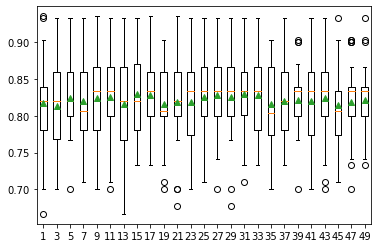

In [ ]:
df5 = optimize_knn_imputer(cleveland_df,'num','cleveland')

In [ ]:
df5.loc[df5['MeanAccuracy'] == df5['MeanAccuracy'].max()] 

,Name,K,MeanAccuracy,stdAccuracy
15,cleveland,31.0,0.829534,0.052947


#**Iterative Imputation-**

---



##**Iterative Imputer**

In [ ]:
def optimize_IterativeImputer_imputer(data, target,name):

    results = list()
    dict={'Name': [],
          'ImputationOrder' : [],
          'Mean_Accuracy':[],
          'std_Dev':[]
    }
    df=pd.DataFrame(dict)
    for s in ['ascending', 'descending', 'roman', 'arabic', 'random']:
        #imputer = KNNImputer(n_neighbors=s, weights='distance', metric='nan_euclidean')
        imputer = IterativeImputer(imputation_order=s)
        array = data.values
        X = array [:,:-1]
        Y = data[target]
        
        #Converting Target Variables to Binary
        data['num'][data.num >0] = 1
        Y_temp = data['num']

        trans = MinMaxScaler()
        trans_X = trans.fit_transform(X)
        
        X_imputed = imputer.fit_transform(trans_X)
        X_imputed_df = pd.DataFrame(X_imputed, columns=data.drop(target, axis=1).columns)
        
        model = RandomForestClassifier()
        cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
        scores = cross_val_score(model, X_imputed, Y_temp, scoring='accuracy', cv=cv, n_jobs=-1)       
        results.append(scores)
        #print(' %s --> Mean : %.3f --> Std : (%.3f)' % (s, mean(scores), std(scores)))  
        df.loc[len(df.index)] = [name, s, mean(scores), std(scores)] 
    display(df)
    plt.boxplot(results, labels=['ascending', 'descending', 'roman', 'arabic', 'random'], showmeans=True)
    plt.show()
    return df

###**1. Iterative imputation on Cleveland + Hungarian + Switzerland + VA**

,Name,ImputationOrder,Mean_Accuracy,std_Dev
0,Clevel + Hung + Switz + VA,ascending,0.833696,0.029321
1,Clevel + Hung + Switz + VA,descending,0.832971,0.033735
2,Clevel + Hung + Switz + VA,roman,0.831159,0.032576
3,Clevel + Hung + Switz + VA,arabic,0.833696,0.028226
4,Clevel + Hung + Switz + VA,random,0.832971,0.029096


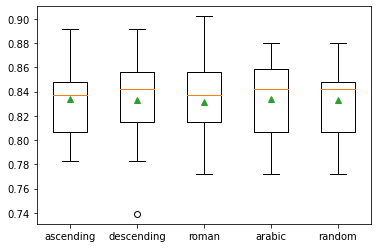

In [ ]:
df1_imput=optimize_IterativeImputer_imputer(Heart_Disease_DF,'num','Clevel + Hung + Switz + VA')

In [ ]:
# Trying to print the max.. but getting an error.. if you can please feel free to solve it.. aim is to print the best score
df1_imput.loc[df1_imput['Mean_Accuracy'] == df1_imput['Mean_Accuracy'].max()] 

,Name,ImputationOrder,Mean_Accuracy,std_Dev
0,Clevel + Hung + Switz + VA,ascending,0.833696,0.029321
3,Clevel + Hung + Switz + VA,arabic,0.833696,0.028226


###**2. Iterative imputation on Cleveland + Hungarian**

,Name,ImputationOrder,Mean_Accuracy,std_Dev
0,clev+hung,ascending,0.836450,0.048756
1,clev+hung,descending,0.832533,0.050742
2,clev+hung,roman,0.836460,0.051424
3,clev+hung,arabic,0.834765,0.043772
4,clev+hung,random,0.833663,0.043114


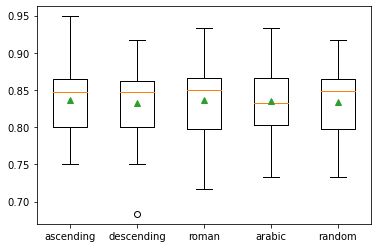

In [ ]:
df2_imput=optimize_IterativeImputer_imputer(Clev_hung_df,'num','clev+hung')

In [ ]:
df2_imput.loc[df2_imput['Mean_Accuracy'] == df2_imput['Mean_Accuracy'].max()] 

,Name,ImputationOrder,Mean_Accuracy,std_Dev
2,clev+hung,roman,0.83646,0.051424


###**3. Iterative imputation on Cleveland + Switzerland**

,Name,ImputationOrder,Mean_Accuracy,std_Dev
0,Clev+Switz,ascending,0.854337,0.054922
1,Clev+Switz,descending,0.853636,0.059988
2,Clev+Switz,roman,0.852861,0.058654
3,Clev+Switz,arabic,0.861443,0.055170
4,Clev+Switz,random,0.850498,0.054061


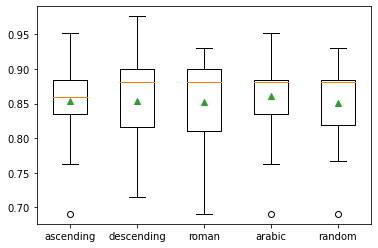

In [ ]:
df3_imput = optimize_IterativeImputer_imputer(Clev_switz_df,'num','Clev+Switz')

In [ ]:
df3_imput.loc[df3_imput['Mean_Accuracy'] == df3_imput['Mean_Accuracy'].max()] 

,Name,ImputationOrder,Mean_Accuracy,std_Dev
3,Clev+Switz,arabic,0.861443,0.05517


###**4. Iterative imputation on Cleveland + Hungarian + Switzerland**

,Name,ImputationOrder,Mean_Accuracy,std_Dev
0,Cleve+Hung+Switz,ascending,0.849537,0.033656
1,Cleve+Hung+Switz,descending,0.849074,0.031617
2,Cleve+Hung+Switz,roman,0.848611,0.035564
3,Cleve+Hung+Switz,arabic,0.850926,0.033436
4,Cleve+Hung+Switz,random,0.851389,0.029386


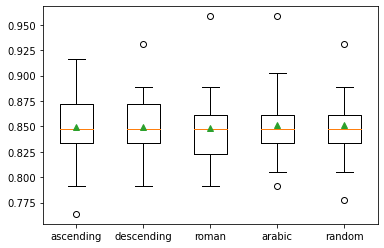

In [ ]:
df4_imput=optimize_IterativeImputer_imputer(Clev_hung_switz_df,'num','Cleve+Hung+Switz')

In [ ]:
df4_imput.loc[df4_imput['Mean_Accuracy'] == df4_imput['Mean_Accuracy'].max()] 

,Name,ImputationOrder,Mean_Accuracy,std_Dev
4,Cleve+Hung+Switz,random,0.851389,0.029386


###**5. Iterative imputation on Cleveland**

,Name,ImputationOrder,Mean_Accuracy,std_Dev
0,Cleveland,ascending,0.831756,0.056567
1,Cleveland,descending,0.817455,0.056649
2,Cleveland,roman,0.831613,0.053752
3,Cleveland,arabic,0.831613,0.054221
4,Cleveland,random,0.825161,0.056688


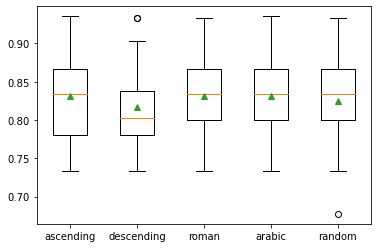

In [ ]:
df5_imput=optimize_IterativeImputer_imputer(cleveland_df,'num','Cleveland')

In [ ]:
df5_imput.loc[df5_imput['Mean_Accuracy'] == df5_imput['Mean_Accuracy'].max()] 

,Name,ImputationOrder,Mean_Accuracy,std_Dev
0,Cleveland,ascending,0.831756,0.056567


## **Final KNN Imputation results**

---



####**Printing a Dataframe for KNN imputer results**

In [ ]:
df1_max = df1.loc[df1.sort_values(by='K', ascending=False)['MeanAccuracy'] == df1.sort_values(by='K', ascending=False)['MeanAccuracy'].max()] 
df2_max = df2.loc[df2.sort_values(by='K', ascending=False)['MeanAccuracy'] == df2.sort_values(by='K', ascending=False)['MeanAccuracy'].max()] 
df3_max  = df3.loc[df3.sort_values(by='K', ascending=False)['MeanAccuracy'] == df3.sort_values(by='K', ascending=False)['MeanAccuracy'].max()] 
df4_max  = df4.loc[df4.sort_values(by='K', ascending=False)['MeanAccuracy'] == df4.sort_values(by='K', ascending=False)['MeanAccuracy'].max()] 
df5_max  = df5.loc[df5.sort_values(by='K', ascending=False)['MeanAccuracy'] == df5.sort_values(by='K', ascending=False)['MeanAccuracy'].max()] 

Optimum_df = pd.concat([df1_max,df2_max,df3_max,df4_max,df5_max])
Optimum_df.reset_index().sort_values(by='MeanAccuracy', ascending=False, na_position='first')

,index,Name,K,MeanAccuracy,stdAccuracy
2,9,cleveland+switzerland,19.0,0.863012,0.052948
3,1,cleveland+hungarian+switzerland,3.0,0.859722,0.028990
1,22,cleveland+hungarian,45.0,0.843117,0.047486
0,18,cleveland+hungarian+switzerland+va,37.0,0.836232,0.034933
4,15,cleveland,31.0,0.829534,0.052947


####**Printing a Dataframe for Iterative imputer results**

In [ ]:
df1_imput_max = df1_imput.loc[df1_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'] == df1_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'].max()] 
df2_imput_max = df2_imput.loc[df2_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'] == df2_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'].max()] 
df3_imput_max  = df3_imput.loc[df3_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'] == df3_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'].max()] 
df4_imput_max  = df4_imput.loc[df4_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'] == df4_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'].max()] 
df5_imput_max  = df5_imput.loc[df5_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'] == df5_imput.sort_values(by='ImputationOrder', ascending=False)['Mean_Accuracy'].max()] 

Optimum_df_imput = pd.concat([df1_imput_max,df2_imput_max,df3_imput_max,df4_imput_max,df5_imput_max])
Optimum_df_imput.reset_index().sort_values(by='Mean_Accuracy', ascending=False, na_position='first')

NameError: name 'df1_imput' is not defined

###**Final Imputed Dataset:** 
Imputation with KNN mean accuracy is higher with smallest std_dev.. so we will select the final imputed dataset Cleveland+Switzerland+Hungarian--- with K=3.

In [ ]:
# function to convert the  imputation results in a dataframe
def Final_Dataset_Prep(data, target , K):
    imputer = KNNImputer(n_neighbors=K, weights='distance', metric='nan_euclidean')
    array = data.values
    X = array[:,:-1]
    trans = MinMaxScaler()
    trans_X = trans.fit_transform(X)   
    X_imputed = imputer.fit_transform(trans_X)
    X_imputed_df = pd.DataFrame(X_imputed, columns=data.drop(target, axis=1).columns)

    data['num'][data.num >0] = 1
    Y_temp = data['num']
    Final_Dataset = pd.concat([d.reset_index(drop=True) for d in [X_imputed_df, Y_temp]], axis=1)
    return Final_Dataset

In [ ]:
# function to inverse the Scaled Transformation
def inversetransform(data, target):
    array = data.values
    X = array[:,:-1]
    trans = MinMaxScaler()
    inverse_trans_X = trans.inverse_transform(trans.fit_transform(X))   
    X_df = pd.DataFrame(inverse_trans_X, columns=data.drop(target, axis=1).columns)

    Y = data[target]
    inverse_Dataset = pd.concat([d.reset_index(drop=True) for d in [X_df, Y]], axis=1)
    return inverse_Dataset

In [ ]:
# createing the final imputed dataset for the project (combining Cleveland, Hungarian, and Switzerland)
data = Clev_hung_switz_df
target = 'num'
K = 3

Final_DF = Final_Dataset_Prep(data,target,K)

Inverse_DF = inversetransform(data,target)

In [ ]:
Final_DF.head

<bound method NDFrame.head of           age  sex        cp  trestbps      chol       fbs  restecg   thalach  \
0    0.714286  1.0  0.000000  0.541667  0.386401  1.000000      1.0  0.633803   
1    0.795918  1.0  1.000000  0.666667  0.474295  0.000000      1.0  0.338028   
2    0.795918  1.0  1.000000  0.333333  0.379768  0.000000      1.0  0.485915   
3    0.183673  1.0  0.666667  0.416667  0.414594  0.000000      0.0  0.894366   
4    0.265306  0.0  0.333333  0.416667  0.338308  0.000000      1.0  0.788732   
..        ...  ...       ...       ...       ...       ...      ...       ...   
715  0.857143  1.0  1.000000  0.291667  0.000000  0.000000      0.5  0.225352   
716  0.857143  1.0  1.000000  0.500000  0.000000  1.000000      0.0  0.683099   
717  0.897959  1.0  0.666667  0.666667  0.000000  0.328777      1.0  0.380282   
718  0.918367  0.0  0.666667  0.666667  0.000000  0.000000      0.5  0.429577   
719  0.938776  1.0  0.333333  0.541667  0.000000  0.000000      0.5  0.443662  

In [ ]:
Inverse_DF

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,1
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,70.0,1.0,4.0,115.0,0.0,0.0,1.0,92.0,1.0,0.0,2.0,NaN,7.0,1
716,70.0,1.0,4.0,140.0,0.0,1.0,0.0,157.0,1.0,2.0,2.0,NaN,7.0,1
717,72.0,1.0,3.0,160.0,0.0,NaN,2.0,114.0,0.0,1.6,2.0,2.0,NaN,0
718,73.0,0.0,3.0,160.0,0.0,0.0,1.0,121.0,0.0,0.0,1.0,NaN,3.0,1


In [ ]:
Final_DF.shape

(720, 14)

In [ ]:
Inverse_DF.shape

(720, 14)

In [ ]:
#checking for the missing values in the final dataset
final_df_nan = pd.DataFrame(Final_DF.isnull().sum())
final_df_nan

,0
age,0
sex,0
cp,0
trestbps,0
chol,0
fbs,0
restecg,0
thalach,0
exang,0
oldpeak,0


**Missing values:** No missing values in the final dataset

In [ ]:
#checking duplicate rows in final dataset:
dups_final_df=Final_DF.duplicated()
print(dups_final_df.any())
print(Final_DF[dups_final_df])

True
          age  sex        cp  trestbps      chol  fbs  restecg   thalach  \
405  0.428571  0.0  0.333333      0.25  0.335584  0.0      0.0  0.704225   

     exang   oldpeak     slope   ca  thal  num  
405    0.0  0.295455  0.134378  0.0   0.0    0  


**Duplicte rows**: there is a one duplicate row so we can remove it.

In [ ]:
# deleting the duplicate rows from the final dataset

In [ ]:
# drops the duplicate and inplace will save changes in the same file
Final_DF.drop_duplicates(inplace=True)
Final_DF.shape

(719, 14)

In [ ]:
Final_DF

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,0.714286,1.0,0.000000,0.541667,0.386401,1.000000,1.0,0.633803,0.0,0.556818,1.0,0.000000,0.750000,0
1,0.795918,1.0,1.000000,0.666667,0.474295,0.000000,1.0,0.338028,1.0,0.465909,0.5,1.000000,0.000000,1
2,0.795918,1.0,1.000000,0.333333,0.379768,0.000000,1.0,0.485915,1.0,0.590909,0.5,0.666667,1.000000,1
3,0.183673,1.0,0.666667,0.416667,0.414594,0.000000,0.0,0.894366,0.0,0.693182,1.0,0.000000,0.000000,0
4,0.265306,0.0,0.333333,0.416667,0.338308,0.000000,1.0,0.788732,0.0,0.454545,0.0,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,0.857143,1.0,1.000000,0.291667,0.000000,0.000000,0.5,0.225352,1.0,0.295455,0.5,0.333333,1.000000,1
716,0.857143,1.0,1.000000,0.500000,0.000000,1.000000,0.0,0.683099,1.0,0.522727,0.5,0.304230,1.000000,1
717,0.897959,1.0,0.666667,0.666667,0.000000,0.328777,1.0,0.380282,0.0,0.477273,0.5,0.666667,0.834796,0
718,0.918367,0.0,0.666667,0.666667,0.000000,0.000000,0.5,0.429577,0.0,0.295455,0.0,0.101401,0.000000,1


In [ ]:
#Final_DF.to_csv(r'.\Final_Dataset.csv', index = False, header=True)

In [ ]:
numerical_int64 = (Final_DF.dtypes == "int64")
numerical_int64

age         False
sex         False
cp          False
trestbps    False
chol        False
fbs         False
restecg     False
thalach     False
exang       False
oldpeak     False
slope       False
ca          False
thal        False
num          True
dtype: bool

In [ ]:
def plot_hist(variable,df):
    dataset = df 
    sns.set_style('darkgrid')
    plt.figure(figsize = (9,3))
    plt.hist(dataset[variable], bins = 50)
    plt.xlabel(variable)
    plt.ylabel("Frequency")
    plt.title("{} distribution with hist".format(variable))
    plt.show()

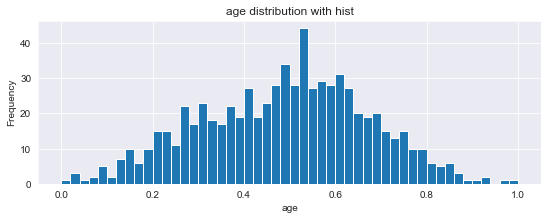

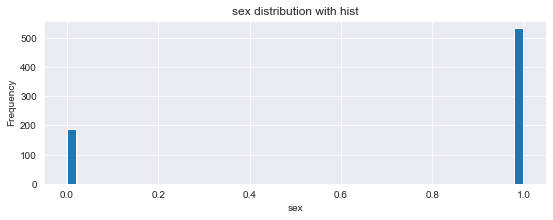

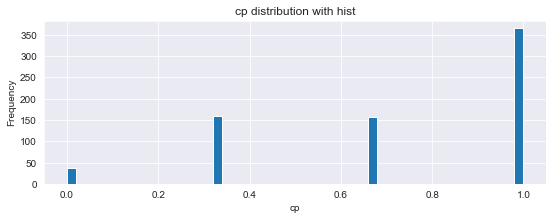

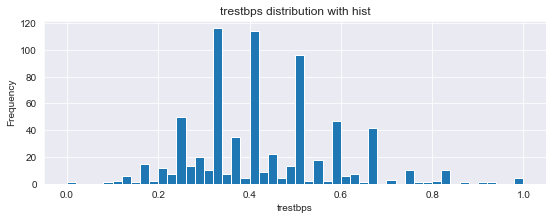

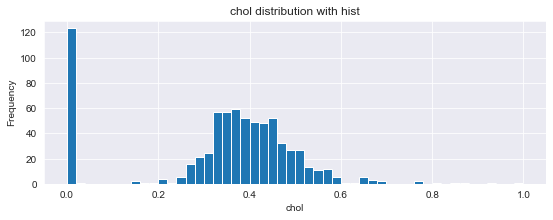

...

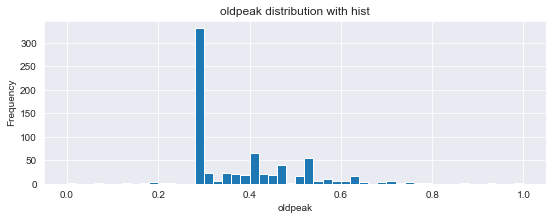

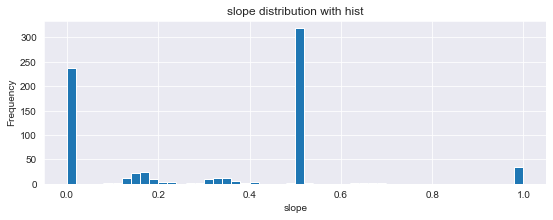

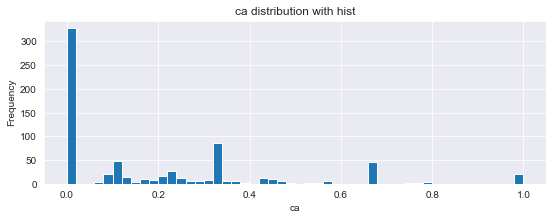

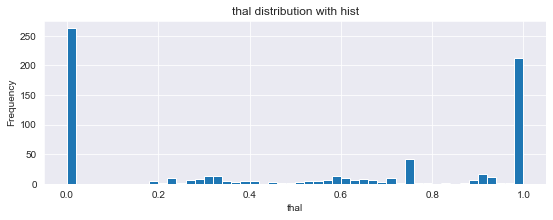

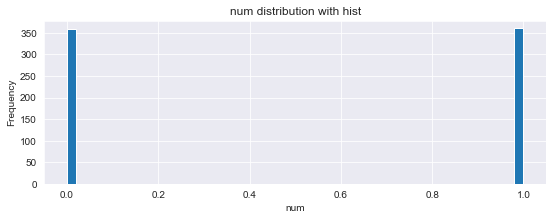

In [ ]:
for n in ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal","num"]:
    plot_hist(n,Final_DF)

<AxesSubplot:xlabel='age', ylabel='Count'>

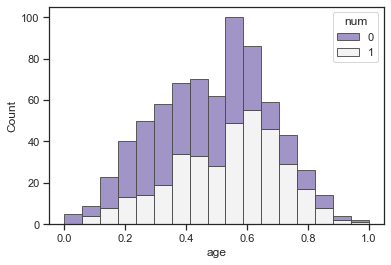

In [ ]:
sns.set_theme(style="ticks")


sns.histplot(
    Final_DF,
    x="age", hue="num",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.9,
    #log_scale=True,
)

In [ ]:
Final_DF[["sex","num"]].groupby(["sex"], as_index = False).mean().sort_values(by="num",ascending = False)

,sex,num
1,1.0,0.588346
0,0.0,0.251337


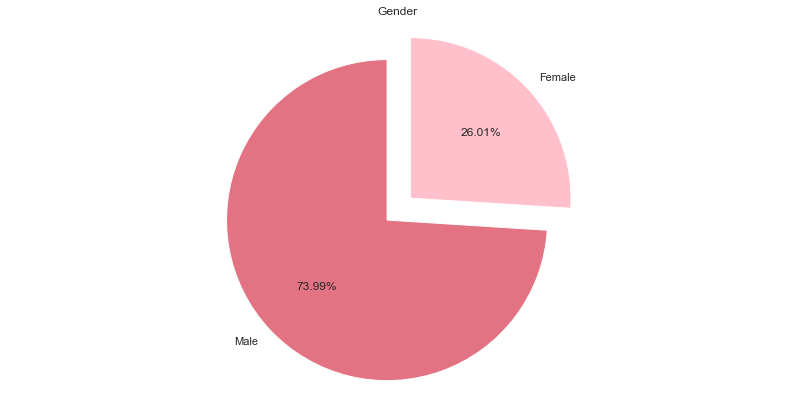

In [ ]:
plt.figure(figsize=(14, 7))
labels=['Male', 'Female']
plt.pie(Final_DF['sex'].value_counts(),labels=labels,explode=[0.1,0.1],
        autopct='%1.2f%%',colors=['#E37383','#FFC0CB'], startangle=90)
plt.title('Gender')
plt.axis('equal')
plt.show()

In [ ]:
Final_DF[["cp","num"]].groupby(["cp"], as_index = False).mean().sort_values(by="num",ascending = False)

,cp,num
3,1.000000,0.778082
0,0.000000,0.394737
2,0.666667,0.267516
1,0.333333,0.119497


<AxesSubplot:xlabel='cp', ylabel='Count'>

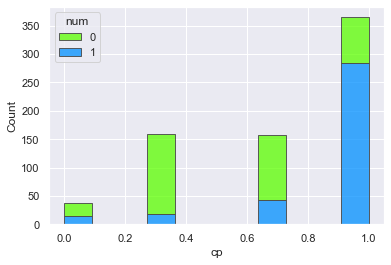

In [ ]:
sns.set_theme(style="ticks")

sns.set_style('darkgrid')
sns.histplot(
    Final_DF,
    x="cp", hue="num",
    multiple="stack",
    palette="gist_rainbow",
    edgecolor=".3",
    linewidth=.9,
    #log_scale=True,
)

In [ ]:
Final_DF[Final_DF['sex']==1.0]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,0.714286,1.0,0.000000,0.541667,0.386401,1.000000,1.0,0.633803,0.000000,0.556818,1.000000,0.000000,0.750000,0
1,0.795918,1.0,1.000000,0.666667,0.474295,0.000000,1.0,0.338028,1.000000,0.465909,0.500000,1.000000,0.000000,1
2,0.795918,1.0,1.000000,0.333333,0.379768,0.000000,1.0,0.485915,1.000000,0.590909,0.500000,0.666667,1.000000,1
3,0.183673,1.0,0.666667,0.416667,0.414594,0.000000,0.0,0.894366,0.000000,0.693182,1.000000,0.000000,0.000000,0
5,0.571429,1.0,0.333333,0.333333,0.391376,0.000000,0.0,0.830986,0.000000,0.386364,0.000000,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714,0.836735,1.0,1.000000,0.388707,0.000000,0.000000,0.5,0.346184,0.934204,0.323119,0.233551,0.274352,1.000000,1
715,0.857143,1.0,1.000000,0.291667,0.000000,0.000000,0.5,0.225352,1.000000,0.295455,0.500000,0.333333,1.000000,1
716,0.857143,1.0,1.000000,0.500000,0.000000,1.000000,0.0,0.683099,1.000000,0.522727,0.500000,0.304230,1.000000,1
717,0.897959,1.0,0.666667,0.666667,0.000000,0.328777,1.0,0.380282,0.000000,0.477273,0.500000,0.666667,0.834796,0


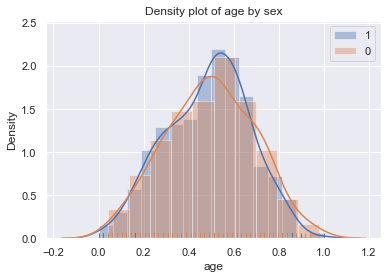

In [ ]:
sns.distplot(Final_DF[Final_DF['sex']==1.0]['age'], rug=True, hist=True, label='1')
sns.distplot(Final_DF[Final_DF['sex']==0.0]['age'], rug=True, hist=True, label='0')
plt.legend()
plt.title('Density plot of age by sex');

#Resting blood pressure (in mm Hg on admission to the hospital)

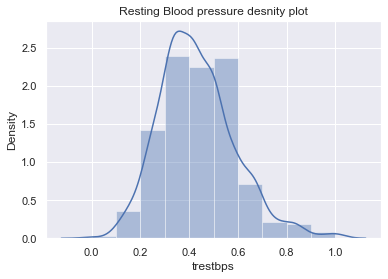

In [ ]:
sns.distplot(Final_DF['trestbps'], bins=10)
plt.title('Resting Blood pressure desnity plot');

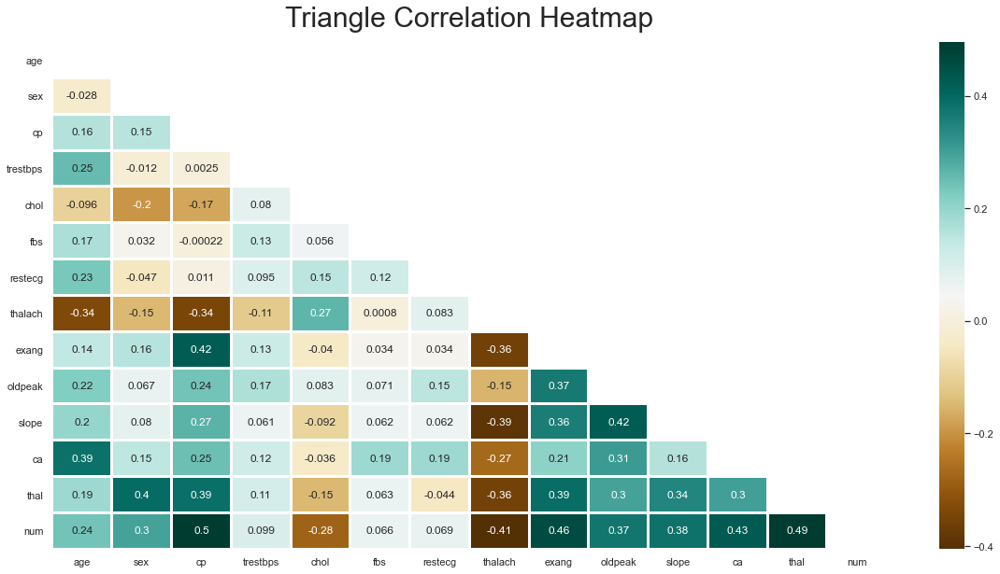

In [ ]:
plt.figure(figsize=(20, 10))
sns.set_style('white')
mask = np.triu(np.ones_like(Final_DF.corr(), dtype=np.bool))
heatmap = sns.heatmap(Final_DF.corr(), mask=mask,annot=True, cmap='BrBG', linewidths = 2)
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':30}, pad=16);

In [ ]:
def plot_scatter(variable,df):
    dataset = df 
    plt.figure(figsize=(30,30))
    sns.set_style('darkgrid')
    sns.pairplot(dataset[variable])
    #sns.set_style('darkgrid')
    #plt.figure(figsize = (9,3))
    #plt.pairplot(dataset[variable], bins = 50)
    plt.xlabel(variable)
    plt.ylabel("Frequency")
    plt.title("{} Scatter plot ".format(variable))
    plt.show()

In [ ]:
for n in ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal","num"]:
    plot_scatter(n,Final_DF)

TypeError: 'data' must be pandas DataFrame object, not: <class 'pandas.core.series.Series'>

<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

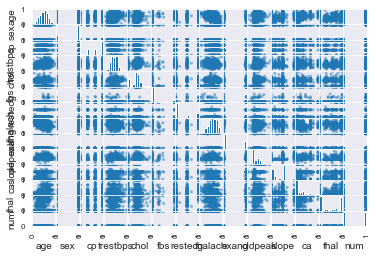

In [ ]:
plt.figure(figsize=(30,30))
pd.plotting.scatter_matrix(Final_DF)
plt.show()

<Figure size 4320x4320 with 0 Axes>

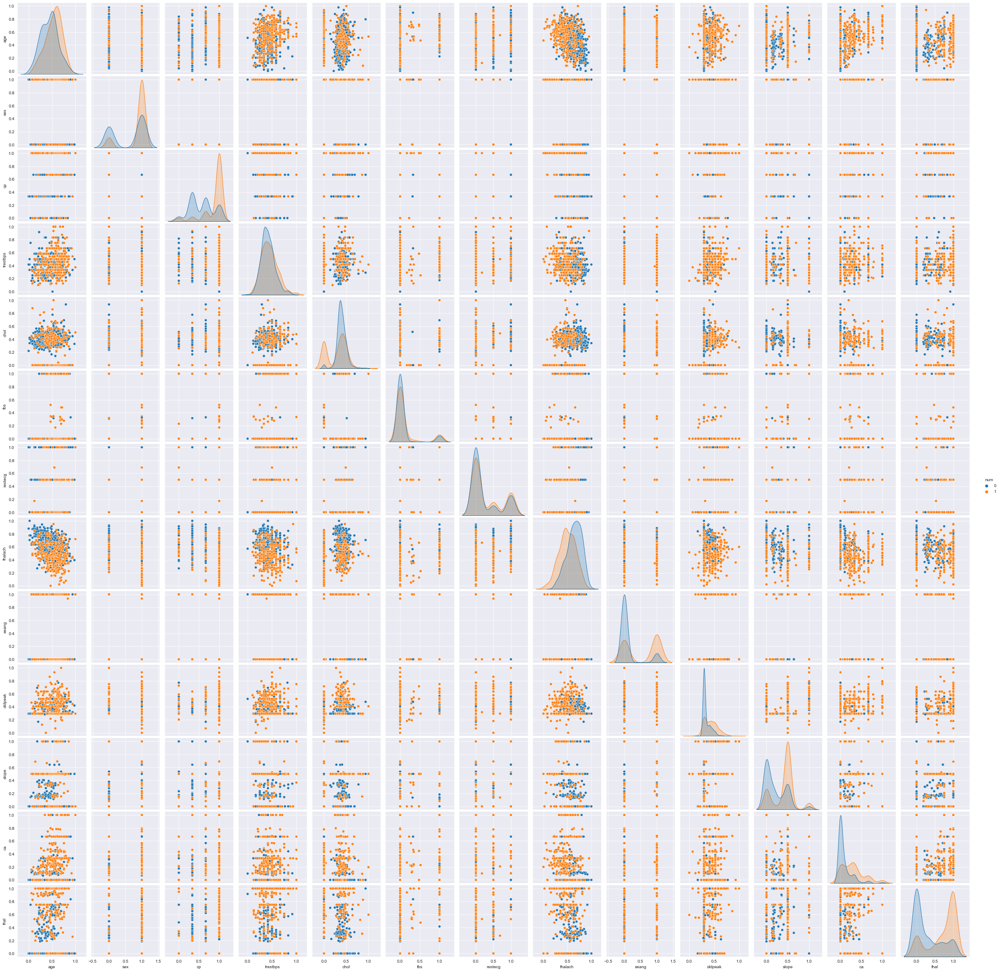

In [ ]:
plt.figure(figsize=(60,60))
sns.set_style('darkgrid')
sns.pairplot(Final_DF, hue='num')

In [ ]:
import plotly_express as px
from plotly.offline import plot, iplot,init_notebook_mode
fig = px.scatter(Final_DF,x = 'age', y = 'trestbps', color = 'num', trendline = 'ols', marginal_y = 'violin')
fig.update_traces(marker = dict(size = 10, ))
fig.update_layout(title = '<b>Distribution of Resting Blood Pressure based on age in people with and without heart attack</b>',
    xaxis_title="Age",
    yaxis_title="Blood Pressure",
    legend_title="Target",
    legend = dict(x = 0)   
)
iplot(fig)

In [ ]:
#Distribution of target based on major sex
import plotly.graph_objects as go
traces = []
for ca,data in Final_DF.groupby('sex'):
    target = data['num'].value_counts(normalize = True)
    trace = go.Bar(
        x = target.index,
        y = target.values,
        text = target.values,
        textposition = 'auto',
        name = ca,
        texttemplate = "%{y:.2f} %"
    )
    traces.append(trace)
fig = go.Figure(data = traces)
fig.update_layout(title = 'Distribution of target based on sex',
    xaxis_title="Target",
    yaxis_title="Counts",
    legend_title="sex"
)
iplot(fig)

In [ ]:
import pandas_profiling as pp   #pip install pandas-profiling
pp.ProfileReport(Final_DF)

# Auto ML

In [ ]:
import h2o
from h2o.automl import H2OAutoML
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import random, os, sys

In [ ]:
pct_memory=0.9
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

6


In [ ]:
# 65535 Highest port no
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:33019 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.251-b08, mixed mode)
  Starting server from C:\Users\anwes\anaconda3\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\anwes\AppData\Local\Temp\tmpcpd1a876
  JVM stdout: C:\Users\anwes\AppData\Local\Temp\tmpcpd1a876\h2o_anwes_started_from_python.out
  JVM stderr: C:\Users\anwes\AppData\Local\Temp\tmpcpd1a876\h2o_anwes_started_from_python.err
  Server is running at http://127.0.0.1:33019
Connecting to H2O server at http://127.0.0.1:33019 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.0.4
H2O_cluster_version_age:,2 months and 2 days
H2O_cluster_name:,H2O_from_python_anwes_gisx87
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5.750 Gb
H2O_cluster_total_cores:,0
H2O_cluster_allowed_cores:,0
H2O_cluster_status:,"accepting new members, healthy"


In [ ]:
h20_df = h2o.H2OFrame(Final_DF)

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [ ]:
def get_independent_variables(df, targ):
    C = [name for name in df.columns if name != targ]
    # determine column types
    ints, reals, enums = [], [], []
    for key, val in df.types.items():
        if key in C:
            if val == 'enum':
                enums.append(key)
            elif val == 'int':
                ints.append(key)            
            else: 
                reals.append(key)    
    x=ints+enums+reals
    return x

In [ ]:
# Set target and predictor variables
y = 'num'

In [ ]:
#X=get_independent_variables(h20_df, 'num') 
X = h20_df.columns
X.remove(y)
print(X)

NameError: name 'h20_df' is not defined

In [ ]:
h20_df[y] = h20_df[y].asfactor()

In [ ]:
h20_df[y]

num
0
1
1
0
0
0
1
0
1
1


In [ ]:
#aml = H2OAutoML(max_runtime_secs=run_time,exclude_algos = ['DeepLearning'])
aml = H2OAutoML(max_models=20, seed=1)

In [ ]:
aml.train(x=X,y=y,training_frame=h20_df)

AutoML progress: |
21:05:03.724: AutoML: XGBoost is not available; skipping it.

████████████████████████████████████████████████████████| 100%


In [ ]:
model_start_time = time.time()
  
try:
  aml.train(x=X,y=y,training_frame=h20_df)  # Change training_frame=train
except Exception as e:
  logging.critical('aml.train') 
  h2o.download_all_logs(dirname=logs_path, filename=log file)      
  h2o.cluster().shutdown()   
  sys.exit(4)

SyntaxError: invalid syntax (<ipython-input-56-a218d2a37d78>, line 7)

In [ ]:
print(aml.leaderboard)

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
GBM_5_AutoML_20210403_210503,0.924398,0.351394,0.922958,0.131944,0.326862,0.106839
StackedEnsemble_AllModels_AutoML_20210403_210503,0.924225,0.351583,0.917389,0.134722,0.325865,0.106188
GBM_grid__1_AutoML_20210403_210503_model_5,0.923943,0.350424,0.918476,0.144444,0.325935,0.106234
GBM_grid__1_AutoML_20210403_210503_model_1,0.923472,0.352329,0.919442,0.138889,0.326964,0.106906
GBM_grid__1_AutoML_20210403_210503_model_3,0.922527,0.352966,0.917967,0.143056,0.329127,0.108325
StackedEnsemble_BestOfFamily_AutoML_20210403_210503,0.922357,0.354321,0.92314,0.125,0.326518,0.106614
GBM_2_AutoML_20210403_210503,0.915999,0.372408,0.915382,0.145833,0.338453,0.11455
GBM_3_AutoML_20210403_210503,0.914838,0.374951,0.906909,0.163889,0.339845,0.115495
GBM_grid__1_AutoML_20210403_210503_model_4,0.914086,0.369884,0.913159,0.15,0.336594,0.113295
DRF_1_AutoML_20210403_210503,0.913723,0.458781,0.911177,0.152778,0.341168,0.116395


# Base Model

In [3]:
import io
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline , FeatureUnion
from sklearn.feature_selection import SelectKBest, chi2 , f_classif
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import Normalizer
import xgboost as xgb
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.metrics import accuracy_score, make_scorer
from sklearn.model_selection import cross_val_score

from sklearn.model_selection import StratifiedKFold
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import roc_curve, precision_recall_curve, auc, make_scorer, recall_score, accuracy_score, precision_score, confusion_matrix, f1_score

from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import metrics
from tabulate import tabulate
from numpy import mean
from numpy import std
from pandas import read_csv
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.feature_selection import RFE
from sklearn.impute import KNNImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from matplotlib import pyplot
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

In [1]:
#upload the file in the lab
from google.colab import files
uploaded = files.upload()
#read the datafile using pandas read_csv

Saving new_Imputed_knn.csv to new_Imputed_knn.csv


In [9]:
Final_Data= pd.read_csv(io.BytesIO(uploaded['new_Imputed_knn.csv']))
Final_DF = Final_Data.iloc[: , 1:]
Final_DF

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,0.714286,1.0,0.000000,0.541667,0.285714,1.000000,1.0,0.633803,0.0,0.556818,1.0,0.000000,0.750000,0
1,0.795918,1.0,1.000000,0.666667,0.388031,0.000000,1.0,0.338028,1.0,0.465909,0.5,1.000000,0.000000,1
2,0.795918,1.0,1.000000,0.333333,0.277992,0.000000,1.0,0.485915,1.0,0.590909,0.5,0.666667,1.000000,1
3,0.183673,1.0,0.666667,0.416667,0.318533,0.000000,0.0,0.894366,0.0,0.693182,1.0,0.000000,0.000000,0
4,0.265306,0.0,0.333333,0.416667,0.229730,0.000000,1.0,0.788732,0.0,0.454545,0.0,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
713,0.857143,1.0,1.000000,0.291667,0.340046,0.000000,0.5,0.225352,1.0,0.295455,0.5,0.350985,1.000000,1
714,0.857143,1.0,1.000000,0.500000,0.383377,1.000000,0.0,0.683099,1.0,0.522727,0.5,0.330718,1.000000,1
715,0.897959,1.0,0.666667,0.666667,0.309130,0.216794,1.0,0.380282,0.0,0.477273,0.5,0.666667,0.632318,0
716,0.918367,0.0,0.666667,0.666667,0.354750,0.000000,0.5,0.429577,0.0,0.295455,0.0,0.140394,0.000000,1


In [ ]:
#LDA:




# Bagging Algo : 

## Random Forest Classifier

In [5]:
def Confusion_Matrix(y_test, y_pred):
    print("Confusion Matrix : ",metrics.confusion_matrix(y_test, y_pred))
    clf_confusion = metrics.confusion_matrix(y_test, y_pred)
    #[row, column]
    TP = clf_confusion[1, 1]
    TN = clf_confusion[0, 0]
    FP = clf_confusion[0, 1]
    FN = clf_confusion[1, 0]

    print("Classification Accuracy : ",(TP + TN) / float(TP + TN + FP + FN))
    print("classification_error : ",(FP + FN) / float(TP + TN + FP + FN))
    print("sensitivity : ",TP / float(FN + TP))
    print("specificity : ",TN / (TN + FP))
    print("false_positive_rate : ",FP / float(TN + FP))
    print("precision : ",TP / float(TP + FP))

In [6]:
def evaluate(model, X_train,y_train, X_test, y_test):
    model.fit(X_train,y_train)
    predictions = model.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, predictions)
    roc_auc = auc(false_positive_rate, true_positive_rate)
   
    plt.figure()
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(false_positive_rate, true_positive_rate, color='darkorange', label='Random Forest')
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve (area = %0.2f)' % roc_auc)
    plt.legend(loc='best')
    plt.show()
    
    return roc_auc

In [7]:
def Print_Metrics(best_model,y_test,X_test,y_predict_test,modelName):
    print('\nModel performance on the test data set:')

    # print('Train Accuracy.......', accuracy_score(y_train, best_model.predict(X_train)))
    # print('Validate Accuracy....', accuracy_score(y_valid, best_model.predict(X_valid)))

    # y_predict_test  = best_model.predict(X_test)
    mse             = metrics.mean_squared_error(y_test, y_predict_test)
    logloss_test    = metrics.log_loss(y_test, y_predict_test)
    accuracy_test   = metrics.accuracy_score(y_test, y_predict_test)
    #accuracy_test2  = best_model.score(X_test, y_test)
    F1_test         = metrics.f1_score(y_test, y_predict_test)
    precision_test  = precision_score(y_test, y_predict_test, average='binary')
    precision_test2 = metrics.precision_score(y_test, y_predict_test)
    recall_test     = recall_score(y_test, y_predict_test, average='binary')
    auc_test        = metrics.roc_auc_score(y_test, y_predict_test)
    r2_test         = metrics.r2_score(y_test, y_predict_test)
   
    #test_auc       = h2o.get_model("best_rf").model_performance(test_data=test).auc()
    #print('Best model performance based on auc: ', test_auc)
    
    header = ["Metric", "Test"]
    table  = [
               ["logloss",   logloss_test],
               ["accuracy",  accuracy_test],
               ["precision", precision_test],
               ["F1",        F1_test],
               ["r2",        r2_test],
               ["AUC",       auc_test]
             ]
    
    result = {
        "logloss" : logloss_test,
        "accuracy":accuracy_test,
        "precision": precision_test,
        "F1":F1_test,
        "r2":r2_test,
        "AUC":auc_test
    }
    
    #df_result = pd.DataFrame(result)
    #df_result = pd.DataFrame(list(result.items()),columns = header)
    data = [[modelName, logloss_test,accuracy_test,precision_test,F1_test,r2_test,auc_test]]
    df_result = pd.DataFrame(data, columns = ['ModelName', 'logloss', 'accuracy','precision', 'F1', 'r2', 'AUC'])
    print(tabulate(table, header, tablefmt="fancy_grid"))
    return df_result

In [10]:
y=Final_DF['num'] 

In [11]:
X=Final_DF[["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal"]]

In [12]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

In [52]:
# LDA with PCA in pipeline

pipelines = [] 
results=[]
names=[]
LDA=pipelines.append(('ScaledLDA', Pipeline([('Scaler', StandardScaler()),('PCA',PCA(n_components=6)),('LDA', LinearDiscriminantAnalysis())])))

for name, model in pipelines:
  kfold=KFold(n_splits=10,random_state=7,shuffle=True)
  cv_results= cross_val_score(model, X_train,y_train,cv=kfold, scoring= 'accuracy')
  results.append(cv_results)
  names.append(name)
  print('n_comp=',i)
  msg= "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  print(msg)

n_comp= 12
ScaledLDA: 0.840392 (0.049474)


In [55]:
pca = PCA(n_components=6) 
fit = pca.fit(X_train) 
# summarize components 
#print("Explained Variance: %s") % fit.explained_variance_ratio_ 
print(fit.components_)

[[-6.95018537e-02 -3.93064439e-01 -2.97554054e-01 -2.47890154e-02
  -1.39261852e-02 -7.19644436e-02 -5.12467547e-02  1.30507080e-01
  -6.25536426e-01 -9.22368312e-02 -2.00464136e-01 -1.53794653e-01
  -5.12682809e-01]
 [ 1.58935164e-01 -5.61315900e-01  9.25329932e-02  5.79100881e-02
   4.02280630e-02  5.76316998e-02  7.31379806e-01 -1.01456094e-02
   2.62359240e-01  7.07853359e-02  9.06704955e-02  9.48635308e-02
  -1.29328708e-01]
 [-6.76672326e-02 -5.66876258e-01  1.59328912e-01 -5.13328588e-03
   1.47161702e-02 -1.12030148e-01 -6.22896447e-01 -6.89405955e-02
   4.64978361e-01 -7.16388831e-04  3.12083307e-02 -5.70174953e-02
  -1.50698197e-01]
 [-1.65052533e-01  3.91811269e-01 -2.40353118e-01 -3.70102448e-02
  -1.29029363e-02 -2.26918938e-01  1.61923755e-01  8.03600699e-02
   5.09956910e-01 -4.83376325e-02 -1.89688852e-01 -2.19657691e-01
  -5.73709455e-01]
 [ 5.36765710e-02 -1.59341681e-02 -4.73588421e-01  8.71971855e-02
  -1.35571795e-02  8.41980173e-01 -1.21895370e-01  4.33235731e-02


In [53]:
clf=RandomForestClassifier(n_estimators=1000,max_features='sqrt',max_depth=12,random_state=7)

#Train the model using the training sets y_pred=clf.predict(X_test)
LDA.fit(X_train,y_train)

y_pred=clf.predict(X_test)

AttributeError: ignored

In [14]:
# Model Accuracy, how often is the classifier correct?
acc_clf = metrics.accuracy_score(y_test, y_pred)
print('\nAccuracy : %0.5f %%\n' % acc_clf)


Accuracy : 0.83333 %



In [15]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.85      0.83       106
           1       0.85      0.82      0.83       110

    accuracy                           0.83       216
   macro avg       0.83      0.83      0.83       216
weighted avg       0.83      0.83      0.83       216



In [16]:
Confusion_Matrix(y_test, y_pred)

Confusion Matrix :  [[90 16]
 [20 90]]
Classification Accuracy :  0.8333333333333334
classification_error :  0.16666666666666666
sensitivity :  0.8181818181818182
specificity :  0.8490566037735849
false_positive_rate :  0.1509433962264151
precision :  0.8490566037735849


In [17]:
RF_Metrics = Print_Metrics(clf,y_test,X_test,y_pred,"RandomForest")
RF_Metrics
Accuracy_LG_RF_Base = format(RF_Metrics['accuracy'])
R2_LG_RF_Base = format(RF_Metrics['r2'])
F1_LG_RF_Base = format(RF_Metrics['F1'])
AUC_LG_RF_Base = format(RF_Metrics['AUC'])


Model performance on the test data set:
╒═══════════╤══════════╕
│ Metric    │     Test │
╞═══════════╪══════════╡
│ logloss   │ 5.75652  │
├───────────┼──────────┤
│ accuracy  │ 0.833333 │
├───────────┼──────────┤
│ precision │ 0.849057 │
├───────────┼──────────┤
│ F1        │ 0.833333 │
├───────────┼──────────┤
│ r2        │ 0.333105 │
├───────────┼──────────┤
│ AUC       │ 0.833619 │
╘═══════════╧══════════╛


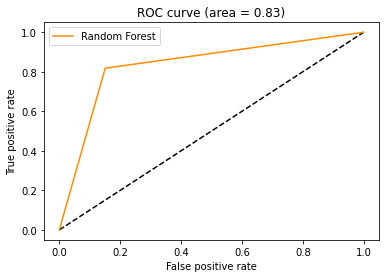

ROC for base model : 0.8336192109777016


In [22]:
print('ROC for base model : ' + str(evaluate(clf,X_train,y_train, X_test, y_test)))

In [23]:
#Return the feature importances (the higher, the more important the feature).
X_features = ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal"]
feature_imp = pd.Series(clf.feature_importances_,index=X_features).sort_values(ascending=False)
feature_imp

ca          0.178033
thal        0.143564
cp          0.127599
slope       0.106477
thalach     0.077500
age         0.074633
chol        0.071863
oldpeak     0.069104
trestbps    0.055869
exang       0.040521
sex         0.022026
fbs         0.017258
restecg     0.015553
dtype: float64

No handles with labels found to put in legend.


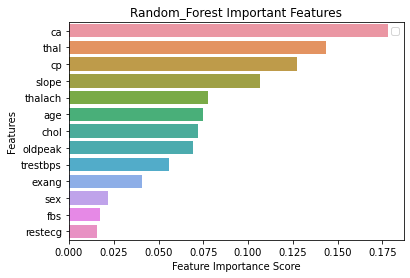

In [25]:
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Random_Forest Important Features")
plt.legend()
plt.show()

In [ ]:
# Look at parameters used by our current forest
from pprint import pprint
print('Parameters currently in use:\n')
pprint(clf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


## bagging Classifier

In [ ]:
from sklearn.ensemble import BaggingClassifier
bagging = BaggingClassifier()
bagging.fit(X_train, y_train)

BaggingClassifier()

In [ ]:
y_pred = bagging.predict(X_test)

In [ ]:
# Model Accuracy, how often is the classifier correct?
acc_bagging = metrics.accuracy_score(y_test, y_pred)
print('\nAccuracy : %0.5f %%\n' % acc_bagging)



Accuracy : 0.83333 %



In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.84      0.84       109
           1       0.84      0.82      0.83       107

    accuracy                           0.83       216
   macro avg       0.83      0.83      0.83       216
weighted avg       0.83      0.83      0.83       216



In [ ]:
Confusion_Matrix(y_test, y_pred)

Confusion Matrix :  [[92 17]
 [19 88]]
Classification Accuracy :  0.8333333333333334
classification_error :  0.16666666666666666
sensitivity :  0.822429906542056
specificity :  0.8440366972477065
false_positive_rate :  0.1559633027522936
precision :  0.8380952380952381


In [ ]:
bagging_Metrics = Print_Metrics(bagging,y_test,X_test,y_pred,"bagging Classifier")
Accuracy_bagging_Metrics_Base = format(bagging_Metrics['accuracy'])
R2_bagging_Metrics_Base = format(bagging_Metrics['r2'])
F1_bagging_Metrics_Base = format(bagging_Metrics['F1'])
AUC_bagging_Metrics_Base = format(bagging_Metrics['AUC'])


Model performance on the test data set:
╒═══════════╤══════════╕
│ Metric    │     Test │
╞═══════════╪══════════╡
│ logloss   │ 5.75653  │
├───────────┼──────────┤
│ accuracy  │ 0.833333 │
├───────────┼──────────┤
│ precision │ 0.838095 │
├───────────┼──────────┤
│ F1        │ 0.830189 │
├───────────┼──────────┤
│ r2        │ 0.333276 │
├───────────┼──────────┤
│ AUC       │ 0.833233 │
╘═══════════╧══════════╛


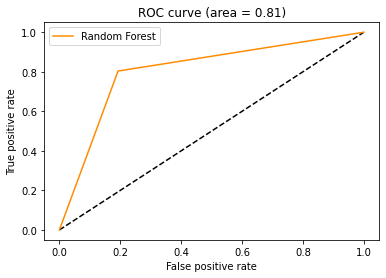

ROC for base model : 0.8055388836491469


In [ ]:

print('ROC for base model : ' + str(evaluate(bagging,X_train,y_train, X_test, y_test)))

In [ ]:
# Look at parameters used by our current forest
from pprint import pprint
print('Parameters currently in use:\n')
pprint(bagging.get_params())

Parameters currently in use:

{'base_estimator': None,
 'bootstrap': True,
 'bootstrap_features': False,
 'max_features': 1.0,
 'max_samples': 1.0,
 'n_estimators': 10,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


# Boosting Algo : 

## XGB Classifier

In [ ]:
##xgboost


In [ ]:
xgBoostClassifierModel = XGBClassifier()
xgBoostClassifierModel.fit(X_train, y_train)

[12:48:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [ ]:
y_pred = xgBoostClassifierModel.predict(X_test)
predictions = [round(value) for value in y_pred]

In [ ]:
# Model Accuracy, how often is the classifier correct?
acc_Xgb = metrics.accuracy_score(y_test, y_pred)
print('\nAccuracy : %0.5f %%\n' % acc_clf)


Accuracy : 0.85648 %



In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.84      0.83       109
           1       0.84      0.81      0.82       107

    accuracy                           0.83       216
   macro avg       0.83      0.83      0.83       216
weighted avg       0.83      0.83      0.83       216



In [ ]:
Confusion_Matrix(y_test, y_pred)

Confusion Matrix :  [[92 17]
 [20 87]]
Classification Accuracy :  0.8287037037037037
classification_error :  0.1712962962962963
sensitivity :  0.8130841121495327
specificity :  0.8440366972477065
false_positive_rate :  0.1559633027522936
precision :  0.8365384615384616


In [ ]:
xgb_Metrics = Print_Metrics(xgBoostClassifierModel,y_test,X_test,y_pred,"XGBoosting")
Accuracy_xgb_Base = format(xgb_Metrics['accuracy'])
R2_xgb_Base = format(xgb_Metrics['r2'])
F1_xgb_Base = format(xgb_Metrics['F1'])
AUC_xgb_Base = format(xgb_Metrics['AUC'])


Model performance on the test data set:
╒═══════════╤══════════╕
│ Metric    │     Test │
╞═══════════╪══════════╡
│ logloss   │ 5.91643  │
├───────────┼──────────┤
│ accuracy  │ 0.828704 │
├───────────┼──────────┤
│ precision │ 0.836538 │
├───────────┼──────────┤
│ F1        │ 0.824645 │
├───────────┼──────────┤
│ r2        │ 0.314756 │
├───────────┼──────────┤
│ AUC       │ 0.82856  │
╘═══════════╧══════════╛


[00:51:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


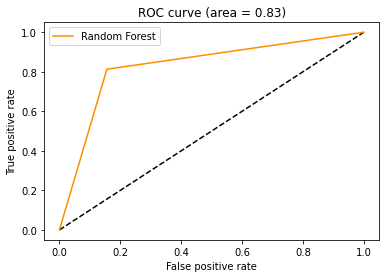

ROC for base model : 0.8285604046986196


In [ ]:
print('ROC for base model : ' + str(evaluate(xgBoostClassifierModel,X_train,y_train, X_test, y_test)))

In [ ]:
#Return the feature importances (the higher, the more important the feature).
X_features = ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal"]
feature_imp = pd.Series(xgBoostClassifierModel.feature_importances_,index=X_features).sort_values(ascending=False)
feature_imp

cp          0.313794
ca          0.134108
slope       0.123966
exang       0.058435
chol        0.054939
oldpeak     0.051477
sex         0.049450
restecg     0.043562
trestbps    0.043034
thal        0.041427
age         0.030100
thalach     0.028199
fbs         0.027509
dtype: float32

No handles with labels found to put in legend.


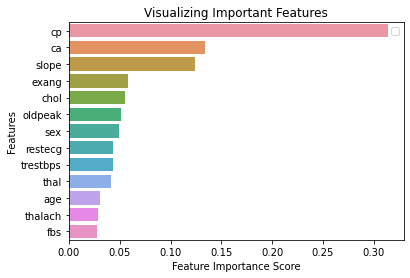

In [ ]:
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

In [ ]:
# Look at parameters used by our current forest
from pprint import pprint
print('Parameters currently in use:\n')
pprint(xgBoostClassifierModel.get_params())

Parameters currently in use:

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'gpu_id': -1,
 'importance_type': 'gain',
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_delta_step': 0,
 'max_depth': 6,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 100,
 'n_jobs': 8,
 'num_parallel_tree': 1,
 'objective': 'binary:logistic',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'use_label_encoder': True,
 'validate_parameters': 1,
 'verbosity': None}


## AdaBoost Classifier

In [34]:
from sklearn.ensemble import AdaBoostClassifier
Ada_Boost = AdaBoostClassifier(base_estimator=RandomForestClassifier(n_estimators=1000,max_features='sqrt',max_depth=12,random_state=7),n_estimators=50,learning_rate=0.0001,random_state=7)
Ada_Boost.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=RandomForestClassifier(bootstrap=True,
                                                         ccp_alpha=0.0,
                                                         class_weight=None,
                                                         criterion='gini',
                                                         max_depth=12,
                                                         max_features='sqrt',
                                                         max_leaf_nodes=None,
                                                         max_samples=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                         

In [35]:
y_pred = Ada_Boost.predict(X_test)

In [36]:
# Model Accuracy, how often is the classifier correct?
acc_clf = metrics.accuracy_score(y_test, y_pred)
print('\nAccuracy : %0.5f %%\n' % acc_clf)


Accuracy : 0.84259 %



In [37]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.87      0.84       106
           1       0.87      0.82      0.84       110

    accuracy                           0.84       216
   macro avg       0.84      0.84      0.84       216
weighted avg       0.84      0.84      0.84       216



In [38]:
Confusion_Matrix(y_test, y_pred)

Confusion Matrix :  [[92 14]
 [20 90]]
Classification Accuracy :  0.8425925925925926
classification_error :  0.1574074074074074
sensitivity :  0.8181818181818182
specificity :  0.8679245283018868
false_positive_rate :  0.1320754716981132
precision :  0.8653846153846154


In [39]:
Ada_Metrics = Print_Metrics(Ada_Boost,y_test,X_test,y_pred, "Ada Boosting")
Accuracy_Ada_Base = format(RF_Metrics['accuracy'])
R2_Ada_Base = format(RF_Metrics['r2'])
F1_Ada_Base = format(RF_Metrics['F1'])
AUC_Ada_Base = format(RF_Metrics['AUC'])


Model performance on the test data set:
╒═══════════╤══════════╕
│ Metric    │     Test │
╞═══════════╪══════════╡
│ logloss   │ 5.43671  │
├───────────┼──────────┤
│ accuracy  │ 0.842593 │
├───────────┼──────────┤
│ precision │ 0.865385 │
├───────────┼──────────┤
│ F1        │ 0.841121 │
├───────────┼──────────┤
│ r2        │ 0.370154 │
├───────────┼──────────┤
│ AUC       │ 0.843053 │
╘═══════════╧══════════╛


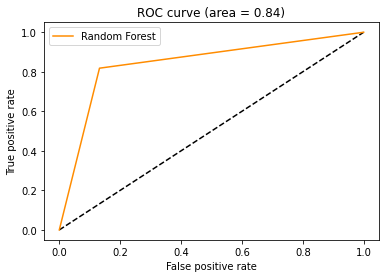

ROC for base model : 0.8430531732418526


In [40]:

print('ROC for base model : ' + str(evaluate(Ada_Boost,X_train,y_train, X_test, y_test)))


In [41]:
#Return the feature importances (the higher, the more important the feature).
X_features = ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal"]
feature_imp = pd.Series(Ada_Boost.feature_importances_,index=X_features).sort_values(ascending=False)
feature_imp

ca          0.173696
thal        0.152429
cp          0.128290
slope       0.100073
thalach     0.079201
age         0.075611
chol        0.070429
oldpeak     0.070173
trestbps    0.056202
exang       0.040738
sex         0.021570
fbs         0.016540
restecg     0.015049
dtype: float64

No handles with labels found to put in legend.


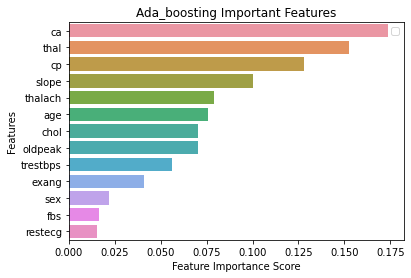

In [44]:
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Ada_boosting Important Features")
plt.legend()
plt.show()

In [ ]:

# Look at parameters used by our current forest
from pprint import pprint
print('Parameters currently in use:\n')
pprint(Ada_Boost.get_params())


Parameters currently in use:

{'algorithm': 'SAMME.R',
 'base_estimator': None,
 'learning_rate': 1.0,
 'n_estimators': 50,
 'random_state': None}


## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(X_train, y_train)

LogisticRegression()

In [ ]:
y_pred = LR.predict(X_test)

In [ ]:
# Model Accuracy, how often is the classifier correct?
acc_LR = metrics.accuracy_score(y_test, y_pred)
print('\nAccuracy : %0.5f %%\n' % acc_clf)


Accuracy : 0.84259 %



In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.83      0.82       109
           1       0.82      0.80      0.81       107

    accuracy                           0.81       216
   macro avg       0.81      0.81      0.81       216
weighted avg       0.81      0.81      0.81       216



In [ ]:
Confusion_Matrix(y_test, y_pred)

Confusion Matrix :  [[90 19]
 [21 86]]
Classification Accuracy :  0.8148148148148148
classification_error :  0.18518518518518517
sensitivity :  0.8037383177570093
specificity :  0.8256880733944955
false_positive_rate :  0.1743119266055046
precision :  0.819047619047619


In [ ]:
LR_Metrics = Print_Metrics(LR,y_test,X_test,y_pred, "Logistic Classification")
Accuracy_LR_Base = format(LR_Metrics['accuracy'])
R2_LR_Base = format(LR_Metrics['r2'])
F1_LR_Base = format(LR_Metrics['F1'])
AUC_LR_Base = format(LR_Metrics['AUC'])


Model performance on the test data set:
╒═══════════╤══════════╕
│ Metric    │     Test │
╞═══════════╪══════════╡
│ logloss   │ 6.39614  │
├───────────┼──────────┤
│ accuracy  │ 0.814815 │
├───────────┼──────────┤
│ precision │ 0.819048 │
├───────────┼──────────┤
│ F1        │ 0.811321 │
├───────────┼──────────┤
│ r2        │ 0.259196 │
├───────────┼──────────┤
│ AUC       │ 0.814713 │
╘═══════════╧══════════╛


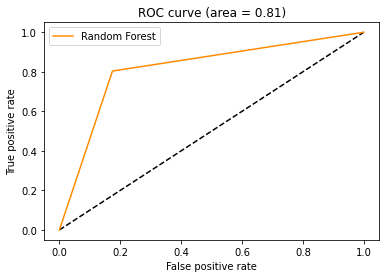

ROC for base model : 0.8147131955757523


In [ ]:
print('ROC for base model : ' + str(evaluate(LR,X_train,y_train, X_test, y_test)))

## Support Vector Machines 

In [ ]:
from sklearn import svm
svr = svm.SVC()

In [ ]:
svr.fit(X_train, y_train)
y_pred = svr.predict(X_test)

In [ ]:
# Model Accuracy, how often is the classifier correct?
acc_svr = metrics.accuracy_score(y_test, y_pred)
print('\nAccuracy : %0.5f %%\n' % acc_svr)


Accuracy : 0.83333 %



In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83       109
           1       0.83      0.83      0.83       107

    accuracy                           0.83       216
   macro avg       0.83      0.83      0.83       216
weighted avg       0.83      0.83      0.83       216



In [ ]:
Confusion_Matrix(y_test, y_pred)

Confusion Matrix :  [[91 18]
 [18 89]]
Classification Accuracy :  0.8333333333333334
classification_error :  0.16666666666666666
sensitivity :  0.8317757009345794
specificity :  0.8348623853211009
false_positive_rate :  0.1651376146788991
precision :  0.8317757009345794


In [ ]:
SVR_Metrics = Print_Metrics(svr,y_test,X_test,y_pred, "SVC")
Accuracy_SVR_Base = format(SVR_Metrics['accuracy'])
R2_SVR_Base = format(SVR_Metrics['r2'])
F1_SVR_Base = format(SVR_Metrics['F1'])
AUC_SVR_Base = format(SVR_Metrics['AUC'])


Model performance on the test data set:
╒═══════════╤══════════╕
│ Metric    │     Test │
╞═══════════╪══════════╡
│ logloss   │ 5.75653  │
├───────────┼──────────┤
│ accuracy  │ 0.833333 │
├───────────┼──────────┤
│ precision │ 0.831776 │
├───────────┼──────────┤
│ F1        │ 0.831776 │
├───────────┼──────────┤
│ r2        │ 0.333276 │
├───────────┼──────────┤
│ AUC       │ 0.833319 │
╘═══════════╧══════════╛


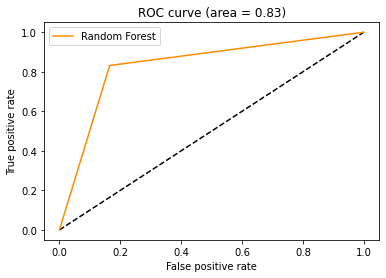

ROC for base model : 0.8333190431278401


In [ ]:
print('ROC for base model : ' + str(evaluate(svr,X_train,y_train, X_test, y_test)))

AttributeError: 'SVC' object has no attribute 'feature_importances_'

In [ ]:
# Look at parameters used by our current model
from pprint import pprint
print('Parameters currently in use:\n')
pprint(svr.get_params())


Parameters currently in use:

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}


# Decision Tree Classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train, y_train)
y_pred = decision_tree.predict(X_test)

In [ ]:
# Model Accuracy, how often is the classifier correct?
acc_DTC = metrics.accuracy_score(y_test, y_pred)
print('\nAccuracy : %0.5f %%\n' % acc_DTC)


Accuracy : 0.81944 %



In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.83      0.82       109
           1       0.83      0.80      0.82       107

    accuracy                           0.82       216
   macro avg       0.82      0.82      0.82       216
weighted avg       0.82      0.82      0.82       216



In [ ]:
Confusion_Matrix(y_test, y_pred)

Confusion Matrix :  [[91 18]
 [21 86]]
Classification Accuracy :  0.8194444444444444
classification_error :  0.18055555555555555
sensitivity :  0.8037383177570093
specificity :  0.8348623853211009
false_positive_rate :  0.1651376146788991
precision :  0.8269230769230769


In [ ]:
DT_Metrics = Print_Metrics(decision_tree,y_test,X_test,y_pred, "Decision Tree Classification")
Accuracy_DT_Base = format(DT_Metrics['accuracy'])
R2_DT_Base = format(DT_Metrics['r2'])
F1_DT_Base = format(DT_Metrics['F1'])
AUC_DT_Base = format(DT_Metrics['AUC'])


Model performance on the test data set:
╒═══════════╤══════════╕
│ Metric    │     Test │
╞═══════════╪══════════╡
│ logloss   │ 6.23623  │
├───────────┼──────────┤
│ accuracy  │ 0.819444 │
├───────────┼──────────┤
│ precision │ 0.826923 │
├───────────┼──────────┤
│ F1        │ 0.815166 │
├───────────┼──────────┤
│ r2        │ 0.277716 │
├───────────┼──────────┤
│ AUC       │ 0.8193   │
╘═══════════╧══════════╛


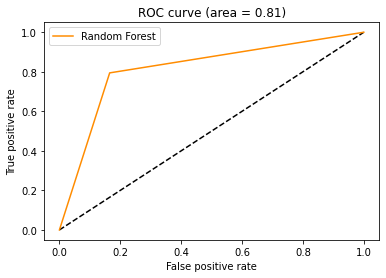

ROC for base model : 0.8146274543427934


In [ ]:
print('ROC for base model : ' + str(evaluate(decision_tree,X_train,y_train, X_test, y_test)))

In [ ]:
#Return the feature importances (the higher, the more important the feature).
X_features = ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal"]
feature_imp = pd.Series(decision_tree.feature_importances_,index=X_features).sort_values(ascending=False)
feature_imp


cp          0.337343
ca          0.164608
chol        0.105211
oldpeak     0.076078
slope       0.064025
age         0.062666
thal        0.061730
trestbps    0.059353
thalach     0.023846
restecg     0.015287
sex         0.012313
exang       0.011516
fbs         0.006025
dtype: float64

No handles with labels found to put in legend.


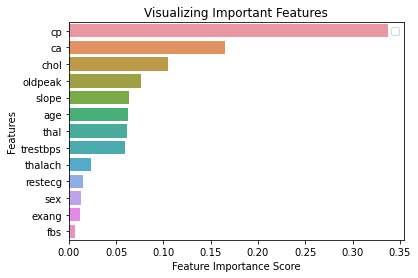

In [ ]:
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

In [ ]:
# Look at parameters used by our current forest
from pprint import pprint
print('Parameters currently in use:\n')
pprint(decision_tree.get_params())

Parameters currently in use:

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': None,
 'splitter': 'best'}


# k-Nearest Neighbors (KNN)

In [ ]:
 from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)


In [ ]:
# Model Accuracy, how often is the classifier correct?
acc_knn = metrics.accuracy_score(y_test, y_pred)
print('\nAccuracy : %0.5f %%\n' % acc_knn)


Accuracy : 0.83796 %



In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.88      0.85       109
           1       0.87      0.79      0.83       107

    accuracy                           0.84       216
   macro avg       0.84      0.84      0.84       216
weighted avg       0.84      0.84      0.84       216



In [ ]:
Confusion_Matrix(y_test, y_pred)

Confusion Matrix :  [[96 13]
 [22 85]]
Classification Accuracy :  0.8379629629629629
classification_error :  0.16203703703703703
sensitivity :  0.794392523364486
specificity :  0.8807339449541285
false_positive_rate :  0.11926605504587157
precision :  0.8673469387755102


In [ ]:
KNN_Metrics = Print_Metrics(knn,y_test,X_test,y_pred, "KNN")
Accuracy_KNN_Base = format(KNN_Metrics['accuracy'])
R2_KNN_Base = format(KNN_Metrics['r2'])
F1_KNN_Base = format(KNN_Metrics['F1'])
AUC_KNN_Base = format(KNN_Metrics['AUC'])


Model performance on the test data set:
╒═══════════╤══════════╕
│ Metric    │     Test │
╞═══════════╪══════════╡
│ logloss   │ 5.59661  │
├───────────┼──────────┤
│ accuracy  │ 0.837963 │
├───────────┼──────────┤
│ precision │ 0.867347 │
├───────────┼──────────┤
│ F1        │ 0.829268 │
├───────────┼──────────┤
│ r2        │ 0.351796 │
├───────────┼──────────┤
│ AUC       │ 0.837563 │
╘═══════════╧══════════╛


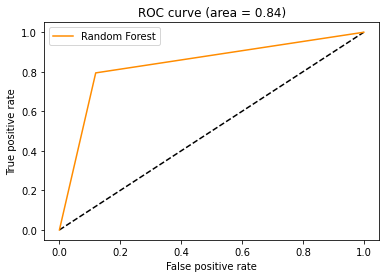

ROC for base model : 0.8375632341593072


In [ ]:
print('ROC for base model : ' + str(evaluate(knn,X_train,y_train, X_test, y_test)))

In [ ]:
# Look at parameters used by our current forest
from pprint import pprint
print('Parameters currently in use:\n')
pprint(knn.get_params())

Parameters currently in use:

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}


# Voting Classifier

In [ ]:
from sklearn.ensemble import VotingClassifier
Voting = VotingClassifier(estimators=[('log', logreg_CV), ('mlp', mlp_GS ), ('svc', linear_svc_CV)])
Voting.fit(X_train, y_train)
y_pred = Voting.predict(X_test)

NameError: name 'logreg_CV' is not defined

# Model Evalution

In [ ]:
final_DF = pd.concat([RF_Metrics, bagging_Metrics
                            ,xgb_Metrics, Ada_Metrics, LR_Metrics,
                            SVR_Metrics,DT_Metrics,KNN_Metrics  ], axis=0)

In [ ]:
final_DF.sort_values(by='accuracy', ascending=False)

,ModelName,logloss,accuracy,precision,F1,r2,AUC
0,RandomForest,4.957017,0.856481,0.845455,0.857143,0.425877,0.856598
0,Ada Boosting,5.436722,0.842593,0.841121,0.841121,0.370316,0.842579
0,KNN,5.596609,0.837963,0.867347,0.829268,0.351796,0.837563
0,bagging Classifier,5.756526,0.833333,0.838095,0.830189,0.333276,0.833233
0,SVC,5.756529,0.833333,0.831776,0.831776,0.333276,0.833319
0,XGBoosting,5.916427,0.828704,0.836538,0.824645,0.314756,0.828560
0,Decision Tree Classification,6.236235,0.819444,0.826923,0.815166,0.277716,0.819300
0,Logistic Classification,6.396140,0.814815,0.819048,0.811321,0.259196,0.814713
